In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
import spacy

from matplotlib.pyplot import imread
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

In [ ]:
reviews=pd.read_csv('reviews6.csv')
reviews

,product,date,title,rating,body
0,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 25 August 2018,Probably the best you can get under 30K!,5.0,Why Bosch:-------------Vs IFB-------- Have own...
1,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 19 December 2020,Marvellous Washing Machine. 5 STAR,5.0,I'm writing my review after 2 years of using t...
2,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 27 August 2018,Machine is superb just pray it should not get ...,4.0,It's almost been a yr now we have purchased th...
3,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 20 July 2017,Pathetic After Sales Service.,3.0,Packaging was good and the delivery was prompt...
4,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 13 September 2018,Dent in the washing machine.,1.0,Dent in the washing machine and washing machi...
...,...,...,...,...,...
815,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 22 May 2019,No technical (and intelligent) coherent support.,1.0,Support is what defines value for money. Anyon...
816,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 6 October 2020,No longer usable after 3 years,1.0,I'm writing this review after using for three ...
817,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 20 September 2018,Bosch service is pathetic - 1 month - compalin...,1.0,"Worst product, got repair in 2 days. worst ser..."
818,Amazon.in:Customer reviews: Bosch 7 kg 5 Star ...,Reviewed in India on 12 December 2018,SIMPLY LOVE MY BOSCH WASHING MACHINE.,5.0,Simply love my Bosch washing machine. DESCALIN...


In [ ]:
reviews=[comment.strip() for comment in reviews.body] # remove both the leading and the trailing characters
reviews=[comment for comment in reviews if comment] # removes empty strings, because they are considered in Python as False
reviews[0:10]

["Why Bosch:-------------Vs IFB-------- Have owned an IFB Elena front-load washing machine for nine years.- Was sold on IFB for their service. Typically the technician reaches you within 24 hrs of logging a complaint.- AMC for about 2.5K per year covers everything, including rubber and plastic parts. Machine was on AMC for all years after warranty.- While service was good, the machine demanded a couple of visits of the technician for something or the other. Meaning product quality is not top notch.- Recent visit of technician revealed that the body has given up and needs replacement. 5.5K for this. This was not a deal breaker. The real problem was the technician arrived 7 days later. Not first incidence, past was like 2-3 days. Hence, said bye bye to IFB.Vs LG---------- Quite a few happy LG washing machine owners in the circle. The happiness comes from excellent service again.- I suppose spares are conomocal too.- I perceived the quality to be at par with IFB. Basis touch and feel of t

In [ ]:
# Joining the list into one string/text
reviews_text=' '.join(reviews)
reviews_text

'Why Bosch:-------------Vs IFB-------- Have owned an IFB Elena front-load washing machine for nine years.- Was sold on IFB for their service. Typically the technician reaches you within 24 hrs of logging a complaint.- AMC for about 2.5K per year covers everything, including rubber and plastic parts. Machine was on AMC for all years after warranty.- While service was good, the machine demanded a couple of visits of the technician for something or the other. Meaning product quality is not top notch.- Recent visit of technician revealed that the body has given up and needs replacement. 5.5K for this. This was not a deal breaker. The real problem was the technician arrived 7 days later. Not first incidence, past was like 2-3 days. Hence, said bye bye to IFB.Vs LG---------- Quite a few happy LG washing machine owners in the circle. The happiness comes from excellent service again.- I suppose spares are conomocal too.- I perceived the quality to be at par with IFB. Basis touch and feel of th

In [ ]:
# Remove Punctuations 
no_punc_text=reviews_text.translate(str.maketrans('','',string.punctuation))
no_punc_text

'Why BoschVs IFB Have owned an IFB Elena frontload washing machine for nine years Was sold on IFB for their service Typically the technician reaches you within 24 hrs of logging a complaint AMC for about 25K per year covers everything including rubber and plastic parts Machine was on AMC for all years after warranty While service was good the machine demanded a couple of visits of the technician for something or the other Meaning product quality is not top notch Recent visit of technician revealed that the body has given up and needs replacement 55K for this This was not a deal breaker The real problem was the technician arrived 7 days later Not first incidence past was like 23 days Hence said bye bye to IFBVs LG Quite a few happy LG washing machine owners in the circle The happiness comes from excellent service again I suppose spares are conomocal too I perceived the quality to be at par with IFB Basis touch and feel of the products and discussions with friends  sales repsVs Samsung D

In [ ]:
# Tokenization
import nltk
nltk.download('punkt')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk import word_tokenize
text_tokens=word_tokenize(no_punc_text)
print(text_tokens[0:50])

['Why', 'BoschVs', 'IFB', 'Have', 'owned', 'an', 'IFB', 'Elena', 'frontload', 'washing', 'machine', 'for', 'nine', 'years', 'Was', 'sold', 'on', 'IFB', 'for', 'their', 'service', 'Typically', 'the', 'technician', 'reaches', 'you', 'within', '24', 'hrs', 'of', 'logging', 'a', 'complaint', 'AMC', 'for', 'about', '25K', 'per', 'year', 'covers', 'everything', 'including', 'rubber', 'and', 'plastic', 'parts', 'Machine', 'was', 'on', 'AMC']


In [ ]:
len(text_tokens)

152356

In [ ]:
# Remove stopwords
from nltk.corpus import stopwords
my_stop_words=stopwords.words('english')

sw_list=['I','The','It','A']
my_stop_words.extend(sw_list)

no_stop_tokens=[word for word in text_tokens if not word in my_stop_words]
print(no_stop_tokens)

['Why', 'BoschVs', 'IFB', 'Have', 'owned', 'IFB', 'Elena', 'frontload', 'washing', 'machine', 'nine', 'years', 'Was', 'sold', 'IFB', 'service', 'Typically', 'technician', 'reaches', 'within', '24', 'hrs', 'logging', 'complaint', 'AMC', '25K', 'per', 'year', 'covers', 'everything', 'including', 'rubber', 'plastic', 'parts', 'Machine', 'AMC', 'years', 'warranty', 'While', 'service', 'good', 'machine', 'demanded', 'couple', 'visits', 'technician', 'something', 'Meaning', 'product', 'quality', 'top', 'notch', 'Recent', 'visit', 'technician', 'revealed', 'body', 'given', 'needs', 'replacement', '55K', 'This', 'deal', 'breaker', 'real', 'problem', 'technician', 'arrived', '7', 'days', 'later', 'Not', 'first', 'incidence', 'past', 'like', '23', 'days', 'Hence', 'said', 'bye', 'bye', 'IFBVs', 'LG', 'Quite', 'happy', 'LG', 'washing', 'machine', 'owners', 'circle', 'happiness', 'comes', 'excellent', 'service', 'suppose', 'spares', 'conomocal', 'perceived', 'quality', 'par', 'IFB', 'Basis', 'touc

In [ ]:
# Normalize the data
lower_words=[comment.lower() for comment in no_stop_tokens]
print(lower_words)


['why', 'boschvs', 'ifb', 'have', 'owned', 'ifb', 'elena', 'frontload', 'washing', 'machine', 'nine', 'years', 'was', 'sold', 'ifb', 'service', 'typically', 'technician', 'reaches', 'within', '24', 'hrs', 'logging', 'complaint', 'amc', '25k', 'per', 'year', 'covers', 'everything', 'including', 'rubber', 'plastic', 'parts', 'machine', 'amc', 'years', 'warranty', 'while', 'service', 'good', 'machine', 'demanded', 'couple', 'visits', 'technician', 'something', 'meaning', 'product', 'quality', 'top', 'notch', 'recent', 'visit', 'technician', 'revealed', 'body', 'given', 'needs', 'replacement', '55k', 'this', 'deal', 'breaker', 'real', 'problem', 'technician', 'arrived', '7', 'days', 'later', 'not', 'first', 'incidence', 'past', 'like', '23', 'days', 'hence', 'said', 'bye', 'bye', 'ifbvs', 'lg', 'quite', 'happy', 'lg', 'washing', 'machine', 'owners', 'circle', 'happiness', 'comes', 'excellent', 'service', 'suppose', 'spares', 'conomocal', 'perceived', 'quality', 'par', 'ifb', 'basis', 'touc

In [ ]:
# Stemming (Optional)
from nltk.stem import PorterStemmer
ps=PorterStemmer()
stemmed_tokens=[ps.stem(word) for word in lower_words]
print(stemmed_tokens)

['whi', 'boschv', 'ifb', 'have', 'own', 'ifb', 'elena', 'frontload', 'wash', 'machin', 'nine', 'year', 'wa', 'sold', 'ifb', 'servic', 'typic', 'technician', 'reach', 'within', '24', 'hr', 'log', 'complaint', 'amc', '25k', 'per', 'year', 'cover', 'everyth', 'includ', 'rubber', 'plastic', 'part', 'machin', 'amc', 'year', 'warranti', 'while', 'servic', 'good', 'machin', 'demand', 'coupl', 'visit', 'technician', 'someth', 'mean', 'product', 'qualiti', 'top', 'notch', 'recent', 'visit', 'technician', 'reveal', 'bodi', 'given', 'need', 'replac', '55k', 'thi', 'deal', 'breaker', 'real', 'problem', 'technician', 'arriv', '7', 'day', 'later', 'not', 'first', 'incid', 'past', 'like', '23', 'day', 'henc', 'said', 'bye', 'bye', 'ifbv', 'lg', 'quit', 'happi', 'lg', 'wash', 'machin', 'owner', 'circl', 'happi', 'come', 'excel', 'servic', 'suppos', 'spare', 'conomoc', 'perceiv', 'qualiti', 'par', 'ifb', 'basi', 'touch', 'feel', 'product', 'discuss', 'friend', 'sale', 'repsv', 'samsung', 'dump', 'quick

In [ ]:
# Lemmatization
nlp=spacy.load('en_core_web_sm')
doc=nlp(' '.join(lower_words))
print(doc)

why boschvs ifb have owned ifb elena frontload washing machine nine years was sold ifb service typically technician reaches within 24 hrs logging complaint amc 25k per year covers everything including rubber plastic parts machine amc years warranty while service good machine demanded couple visits technician something meaning product quality top notch recent visit technician revealed body given needs replacement 55k this deal breaker real problem technician arrived 7 days later not first incidence past like 23 days hence said bye bye ifbvs lg quite happy lg washing machine owners circle happiness comes excellent service suppose spares conomocal perceived quality par ifb basis touch feel products discussions friends sales repsvs samsung dumped quickly considering neither product quality siemens bosch service lg ifbvs siemens siemens bosch family products similar siemens considered bit premium product pricing premium amazon didnt siemens products if might bought siemensbosch finally even

In [ ]:
lemmas=[token.lemma_ for token in doc]
print(lemmas)

['why', 'boschvs', 'ifb', 'have', 'own', 'ifb', 'elena', 'frontload', 'washing', 'machine', 'nine', 'year', 'be', 'sell', 'ifb', 'service', 'typically', 'technician', 'reach', 'within', '24', 'hrs', 'log', 'complaint', 'amc', '25k', 'per', 'year', 'cover', 'everything', 'include', 'rubber', 'plastic', 'part', 'machine', 'amc', 'year', 'warranty', 'while', 'service', 'good', 'machine', 'demand', 'couple', 'visit', 'technician', 'something', 'meaning', 'product', 'quality', 'top', 'notch', 'recent', 'visit', 'technician', 'reveal', 'body', 'give', 'need', 'replacement', '55k', 'this', 'deal', 'breaker', 'real', 'problem', 'technician', 'arrive', '7', 'day', 'later', 'not', 'first', 'incidence', 'past', 'like', '23', 'day', 'hence', 'say', 'bye', 'bye', 'ifbvs', 'lg', 'quite', 'happy', 'lg', 'washing', 'machine', 'owner', 'circle', 'happiness', 'come', 'excellent', 'service', 'suppose', 'spare', 'conomocal', 'perceive', 'quality', 'par', 'ifb', 'basis', 'touch', 'feel', 'product', 'discus

In [ ]:
clean_reviews=' '.join(lemmas)
clean_reviews

"why boschvs ifb have own ifb elena frontload washing machine nine year be sell ifb service typically technician reach within 24 hrs log complaint amc 25k per year cover everything include rubber plastic part machine amc year warranty while service good machine demand couple visit technician something meaning product quality top notch recent visit technician reveal body give need replacement 55k this deal breaker real problem technician arrive 7 day later not first incidence past like 23 day hence say bye bye ifbvs lg quite happy lg washing machine owner circle happiness come excellent service suppose spare conomocal perceive quality par ifb basis touch feel product discussion friend sale repsvs samsung dump quickly consider neither product quality siemens bosch service lg ifbvs siemens siemens bosch family product similar siemens considered bit premium product pricing premium amazon do not siemens product if may bought siemensbosch finally even child tell difference build quality bosc


## Feature Extraction
### 1. Using CountVectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()
reviewscv=cv.fit_transform(lemmas)

In [ ]:
print(cv.vocabulary_)

{'why': 572, 'boschvs': 85, 'ifb': 281, 'have': 267, 'own': 377, 'elena': 187, 'frontload': 241, 'washing': 564, 'machine': 323, 'nine': 352, 'year': 584, 'be': 70, 'sell': 466, 'service': 471, 'typically': 542, 'technician': 520, 'reach': 425, 'within': 576, '24': 13, 'hrs': 277, 'log': 318, 'complaint': 119, 'amc': 45, '25k': 16, 'per': 388, 'cover': 138, 'everything': 201, 'include': 286, 'rubber': 454, 'plastic': 392, 'part': 383, 'warranty': 561, 'while': 569, 'good': 252, 'demand': 159, 'couple': 136, 'visit': 555, 'something': 494, 'meaning': 334, 'product': 410, 'quality': 420, 'top': 538, 'notch': 357, 'recent': 431, 'reveal': 447, 'body': 80, 'give': 249, 'need': 347, 'replacement': 441, '55k': 24, 'this': 530, 'deal': 149, 'breaker': 89, 'real': 428, 'problem': 408, 'arrive': 55, 'day': 146, 'later': 307, 'not': 356, 'first': 230, 'incidence': 285, 'past': 385, 'like': 316, '23': 11, 'hence': 270, 'say': 464, 'bye': 93, 'ifbvs': 282, 'lg': 313, 'quite': 422, 'happy': 265, 'o

In [ ]:
print(cv.get_feature_names()[150:300])

['decide', 'decision', 'defective', 'defectiveno', 'define', 'delay', 'delicate', 'deliver', 'delivery', 'demand', 'demo', 'dent', 'descale', 'describe', 'despite', 'detail', 'detergent', 'dettol', 'device', 'difference', 'directly', 'discount', 'discussion', 'display', 'do', 'dont', 'door', 'dose', 'drawer', 'drum', 'dump', 'each', 'ear', 'earthed', 'electric', 'electrical', 'electrify', 'elena', 'else', 'emi', 'empty', 'engineer', 'engineering', 'enough', 'ensure', 'equipped', 'especially', 'etc', 'even', 'ever', 'every', 'everything', 'excel', 'excellent', 'excess', 'exchange', 'executive', 'expect', 'expensive', 'experience', 'expire', 'extend', 'extended', 'eye', 'fabric', 'fabulous', 'failure', 'fall', 'family', 'fantastic', 'far', 'fault', 'feature', 'feedback', 'feel', 'field', 'finally', 'find', 'fine', 'firm', 'first', 'fix', 'folk', 'follow', 'for', 'four', 'fouryear', 'frame', 'frequently', 'friend', 'front', 'frontload', 'frustrate', 'function', 'funny', 'gasket', 'general

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print(reviewscv.toarray()[150:300])

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
print(reviewscv.toarray().shape)

(93808, 588)



### 2. CountVectorizer with N-grams (Bigrams & Trigrams)


In [ ]:
cv_ngram_range=CountVectorizer(analyzer='word',ngram_range=(1,3),max_features=100)
bow_matrix_ngram=cv_ngram_range.fit_transform(lemmas)

In [ ]:
print(cv_ngram_range.get_feature_names())
print(bow_matrix_ngram.toarray())

['2018', 'ago', 'amazon', 'another', 'appliance', 'aug', 'bad', 'bare', 'be', 'bosch', 'but', 'buy', 'call', 'check', 'close', 'clothe', 'come', 'cost', 'could', 'couple', 'customer', 'daily', 'day', 'delivery', 'demo', 'descale', 'do', 'drum', 'dump', 'engineer', 'etc', 'even', 'excellent', 'first', 'fix', 'friend', 'get', 'give', 'good', 'ground', 'guy', 'high', 'if', 'ifb', 'install', 'installation', 'issue', 'kg', 'know', 'lg', 'like', 'machine', 'make', 'money', 'month', 'mumbai', 'need', 'never', 'not', 'now', 'one', 'online', 'part', 'piece', 'premium', 'price', 'problem', 'product', 'pron', 'purchase', 'quality', 'recommend', 'request', 'review', 'rpm', 'run', 'rupee', 'say', 'service', 'set', 'shock', 'siemens', 'simply', 'small', 'so', 'spare', 'suggest', 'take', 'technician', 'time', 'touch', 'two', 'use', 'value', 'visit', 'wash', 'washing', 'work', 'would', 'year']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 .

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


### 3. TF-IDF Vectorizer


In [ ]:

from sklearn.feature_extraction.text import TfidfVectorizer
tfidfv_ngram_max_features=TfidfVectorizer(norm='l2',analyzer='word',ngram_range=(1,3),max_features=500)
tfidf_matrix_ngram=tfidfv_ngram_max_features.fit_transform(lemmas)

In [ ]:
print(tfidfv_ngram_max_features.get_feature_names())
print(tfidf_matrix_ngram.toarray())

['10', '10001500', '100ml', '12', '1200', '15', '150ml', '17k', '20000', '2018', '22nd', '23', '23rd', '24', '24000', '25', '25k', '26500', '29k', '30', '30000', '3499update', '47', '500ml', '55k', '60', '800', 'ability', 'absolve', 'accidentally', 'accord', 'acid', 'ack', 'acknowledge', 'act', 'address', 'advice', 'agency', 'ago', 'all', 'almost', 'along', 'already', 'also', 'amazon', 'amc', 'another', 'anyone', 'anything', 'anywhere', 'apologize', 'appliance', 'appliancesi', 'apply', 'arrange', 'arrive', 'ask', 'assume', 'at', 'audacity', 'aug', 'awesome', 'backupdate', 'bad', 'bake', 'balance', 'bandaid', 'bare', 'basis', 'bathroom', 'be', 'because', 'bed', 'behavior', 'besides', 'best', 'bicarbonate', 'bit', 'blame', 'bmw', 'body', 'bolt', 'bonus', 'bosch', 'boschs', 'boschvs', 'bottom', 'bought', 'brand', 'breaker', 'build', 'but', 'buy', 'bye', 'cal', 'call', 'cap', 'capacity', 'card', 'care', 'case', 'centre', 'certain', 'chassis', 'check', 'child', 'chip', 'choose', 'circle', '

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


### Generate Word Cloud

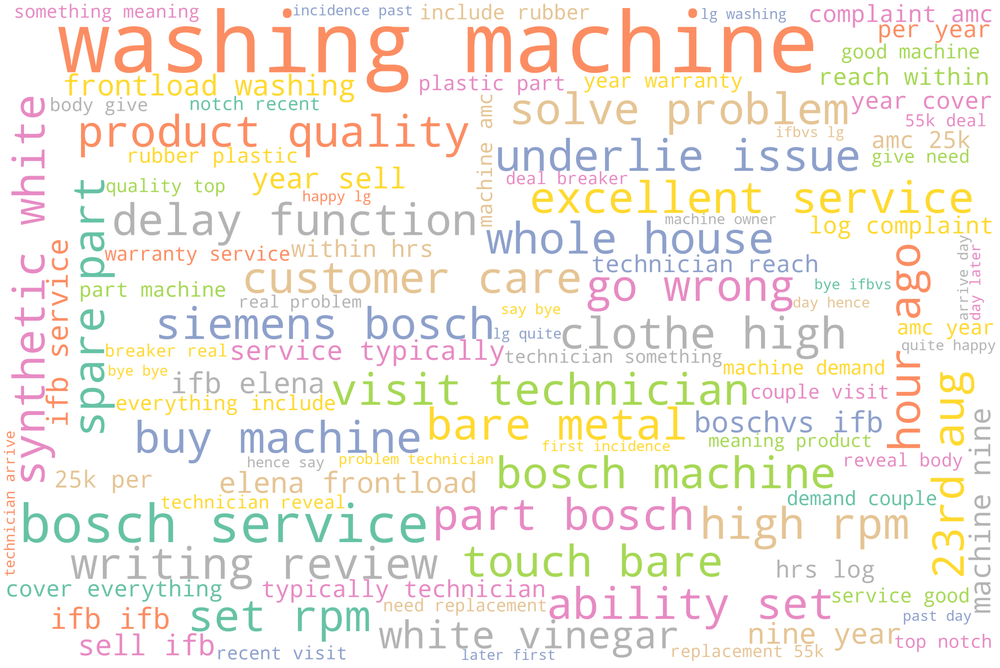

In [ ]:
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(40,30))
    plt.imshow(wordcloud)
    plt.axis('off')

# Generate word cloud

STOPWORDS.add('Pron')
wordcloud=WordCloud(width=3000,height=2000,background_color='white',max_words=100,
                   colormap='Set2',stopwords=STOPWORDS).generate(clean_reviews)
plot_cloud(wordcloud)


### Named Entity Recognition (NER)


In [ ]:
# Parts of speech (POS) tagging
nlp=spacy.load('en_core_web_sm')

one_block=clean_reviews
doc_block=nlp(one_block)
spacy.displacy.render(doc_block,style='ent',jupyter=True)

In [ ]:
for token in doc_block[100:200]:
    print(token,token.pos_)

par NOUN
ifb X
basis NOUN
touch VERB
feel VERB
product NOUN
discussion NOUN
friend NOUN
sale PROPN
repsvs PROPN
samsung PROPN
dump PROPN
quickly ADV
consider VERB
neither DET
product NOUN
quality NOUN
siemens PROPN
bosch PROPN
service PROPN
lg PROPN
ifbvs PROPN
siemens PROPN
siemens PROPN
bosch PROPN
family NOUN
product NOUN
similar ADJ
siemens PROPN
considered ADJ
bit NOUN
premium ADJ
product NOUN
pricing NOUN
premium NOUN
amazon PROPN
do AUX
not PART
siemens PROPN
product NOUN
if SCONJ
may VERB
bought VERB
siemensbosch NOUN
finally ADV
even ADV
child NOUN
tell VERB
difference NOUN
build NOUN
quality PROPN
bosch NOUN
machine NOUN
vis X
vis X
anything PRON
else ADV
spare ADJ
part NOUN
may VERB
expensive VERB
feedback VERB
four NUM
friend NOUN
suggest VERB
many ADJ
thing NOUN
go VERB
wrong ADJ
friend NOUN
use VERB
machine NOUN
24 NUM
8 NUM
year NOUN
respectively ADV
have AUX
not PART
call VERB
technician ADJ
year NOUN
mumbai PROPN
supposedly ADV
bosch PROPN
excellent ADJ
service NOUN
de

In [ ]:
# Filtering the nouns and verbs only
nouns_verbs=[token.text for token in doc_block if token.pos_ in ('NOUN','VERB')]
print(nouns_verbs[100:200])

['premium', 'online', 'product', 'use', 'machine', 'take', 'buy', 'find', 'balance', 'price', 'value', 'term', 'feature', 'model', 'series', 'lack', 'thing', 'thought', 'make', 'sense', 'take', 'couple', 'decision', 'maker', 'rpm', 'kg', 'capacity', 'time', 'delay', 'function', 'ability', 'set', 'rpm', 'temperature', 'use', 'kg', 'machine', 'need', 'hand', 'wash', 'could', 'solve', 'problem', 'suggest', 'wash', 'rpm', 'get', 'ruin', 'say', 'rpm', 'ability', 'set', 'rpm', 'solve', 'problem', 'set', 'rpm', 'function', 'ensure', 'machine', 'cycle', 'pull', 'lie', 'machine', 'hoursorder', 'experience', 'buy', 'p.m.', 'machine', 'arrive', 'p.m.', 'remember', 'get', 'month', 'nocost', 'check', 'store', 'come', 'could', 'awesome', 'exchange', 'machineinstallation', 'demo', 'internet', 'suggest', 'wait', 'get', 'installation', 'call', 'bosch', 'customer', 'care', 'call', 'p.m.', 'ask', 'detail', 'suggest', 'call', 'day', 'log']


In [ ]:
# Counting the noun & verb tokens
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer()

X=cv.fit_transform(nouns_verbs)
sum_words=X.sum(axis=0)

words_freq=[(word,sum_words[0,idx]) for word,idx in cv.vocabulary_.items()]
words_freq=sorted(words_freq,key=lambda x: x[1],reverse=True)

wd_df=pd.DataFrame(words_freq)
wd_df.columns=['word','count']
wd_df[0:10] # viewing top ten results

,word,count
0,machine,2706
1,product,984
2,washing,902
3,buy,902
4,service,820
5,year,738
6,call,738
7,get,738
8,bosch,656
9,use,656


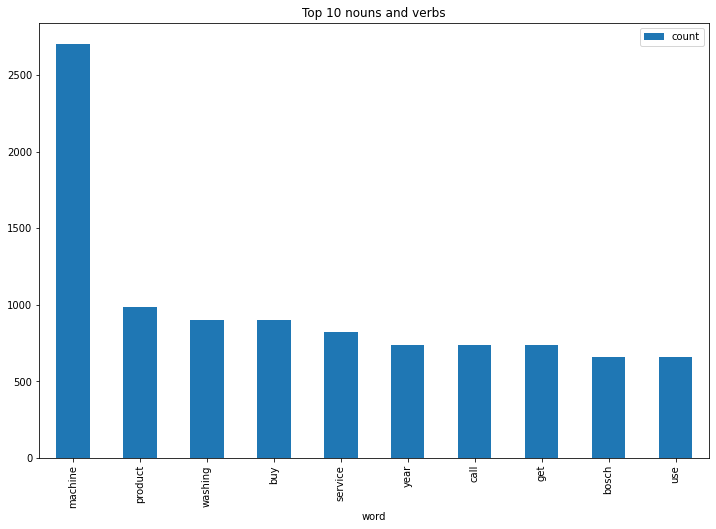

In [ ]:
# Visualizing results (Barchart for top 10 nouns + verbs)
wd_df[0:10].plot.bar(x='word',figsize=(12,8),title='Top 10 nouns and verbs');


### Emotion Mining - Sentiment Analysis


In [ ]:
from nltk import tokenize
sentences=tokenize.sent_tokenize(' '.join(reviews))
sentences

['Why Bosch:-------------Vs IFB-------- Have owned an IFB Elena front-load washing machine for nine years.- Was sold on IFB for their service.',
 'Typically the technician reaches you within 24 hrs of logging a complaint.- AMC for about 2.5K per year covers everything, including rubber and plastic parts.',
 'Machine was on AMC for all years after warranty.- While service was good, the machine demanded a couple of visits of the technician for something or the other.',
 'Meaning product quality is not top notch.- Recent visit of technician revealed that the body has given up and needs replacement.',
 '5.5K for this.',
 'This was not a deal breaker.',
 'The real problem was the technician arrived 7 days later.',
 'Not first incidence, past was like 2-3 days.',
 'Hence, said bye bye to IFB.Vs LG---------- Quite a few happy LG washing machine owners in the circle.',
 'The happiness comes from excellent service again.- I suppose spares are conomocal too.- I perceived the quality to be at par

In [ ]:
sent_df=pd.DataFrame(sentences,columns=['sentence'])
sent_df

,sentence
0,Why Bosch:-------------Vs IFB-------- Have own...
1,Typically the technician reaches you within 24...
2,Machine was on AMC for all years after warrant...
3,Meaning product quality is not top notch.- Rec...
4,5.5K for this.
...,...
7786,"BONUS TIP: For 4-7 Kg of clothes, you can use ..."
7787,It will save you a lot money.
7788,Amazon delivery is 3 rd class+ bosch India cus...
7789,The machine is running in our bathroom 2 peopl...


In [ ]:
# Emotion Lexicon - Affin
affin=pd.read_csv('Afinn.csv',sep=',',encoding='Latin-1')
affin

,word,value
0,abandon,-2
1,abandoned,-2
2,abandons,-2
3,abducted,-2
4,abduction,-2
...,...,...
2472,yucky,-2
2473,yummy,3
2474,zealot,-2
2475,zealots,-2


In [ ]:
affinity_scores=affin.set_index('word')['value'].to_dict()
affinity_scores

{'abandon': -2,
 'abandoned': -2,
 'abandons': -2,
 'abducted': -2,
 'abduction': -2,
 'abductions': -2,
 'abhor': -3,
 'abhorred': -3,
 'abhorrent': -3,
 'abhors': -3,
 'abilities': 2,
 'ability': 2,
 'aboard': 1,
 'absentee': -1,
 'absentees': -1,
 'absolve': 2,
 'absolved': 2,
 'absolves': 2,
 'absolving': 2,
 'absorbed': 1,
 'abuse': -3,
 'abused': -3,
 'abuses': -3,
 'abusive': -3,
 'accept': 1,
 'accepted': 1,
 'accepting': 1,
 'accepts': 1,
 'accident': -2,
 'accidental': -2,
 'accidentally': -2,
 'accidents': -2,
 'accomplish': 2,
 'accomplished': 2,
 'accomplishes': 2,
 'accusation': -2,
 'accusations': -2,
 'accuse': -2,
 'accused': -2,
 'accuses': -2,
 'accusing': -2,
 'ache': -2,
 'achievable': 1,
 'aching': -2,
 'acquit': 2,
 'acquits': 2,
 'acquitted': 2,
 'acquitting': 2,
 'acrimonious': -3,
 'active': 1,
 'adequate': 1,
 'admire': 3,
 'admired': 3,
 'admires': 3,
 'admiring': 3,
 'admit': -1,
 'admits': -1,
 'admitted': -1,
 'admonish': -2,
 'admonished': -2,
 'adopt': 

In [ ]:
# Custom function: score each word in a sentence in lemmatised form, but calculate the score for the whole original sentence
nlp=spacy.load('en_core_web_sm')
sentiment_lexicon=affinity_scores

def calculate_sentiment(text:str=None):
    sent_score=0
    if text:
        sentence=nlp(text)
        for word in sentence:
            sent_score+=sentiment_lexicon.get(word.lemma_,0)
    return sent_score

In [ ]:
# manual testing
calculate_sentiment(text='good service')

3

In [ ]:
# Calculating sentiment value for each sentence
sent_df['sentiment_value']=sent_df['sentence'].apply(calculate_sentiment)
sent_df['sentiment_value']

0       0
1       1
2       2
3       2
4       0
       ..
7786    2
7787    2
7788   -5
7789    0
7790    4
Name: sentiment_value, Length: 7791, dtype: int64

In [ ]:
# how many words are there in a sentence?
sent_df['word_count']=sent_df['sentence'].str.split().apply(len)
sent_df['word_count']

0       21
1       25
2       28
3       21
4        3
        ..
7786    33
7787     7
7788    35
7789    64
7790    13
Name: word_count, Length: 7791, dtype: int64

In [ ]:
# Sentiment score of the whole review
sent_df['sentiment_value'].describe()

count    7791.000000
mean        0.199974
std         2.164791
min        -5.000000
25%        -1.000000
50%         0.000000
75%         2.000000
max         6.000000
Name: sentiment_value, dtype: float64

In [ ]:
# negative sentiment score of the whole review
sent_df[sent_df['sentiment_value']<=0]

,sentence,sentiment_value,word_count
0,Why Bosch:-------------Vs IFB-------- Have own...,0,21
4,5.5K for this.,0,3
5,This was not a deal breaker.,0,6
6,The real problem was the technician arrived 7 ...,-2,10
10,Basis touch and feel of the products and discu...,-1,68
...,...,...,...
7782,Measure 150ml of Synthetic White Vinegar (Citr...,0,21
7784,Job done!,0,2
7785,Do it once a month or every 30 washes.,0,9
7788,Amazon delivery is 3 rd class+ bosch India cus...,-5,35


In [ ]:
# positive sentiment score of the whole review
sent_df[sent_df['sentiment_value']>0]

,sentence,sentiment_value,word_count
1,Typically the technician reaches you within 24...,1,25
2,Machine was on AMC for all years after warrant...,2,28
3,Meaning product quality is not top notch.- Rec...,2,21
7,"Not first incidence, past was like 2-3 days.",2,8
8,"Hence, said bye bye to IFB.Vs LG---------- Qui...",3,18
...,...,...,...
7779,Please think about service before purchase Sim...,4,12
7783,Choose Drum Clean option and run the washing m...,2,9
7786,"BONUS TIP: For 4-7 Kg of clothes, you can use ...",2,33
7787,It will save you a lot money.,2,7


In [ ]:
# Adding index cloumn
sent_df['index']=range(0,len(sent_df))
sent_df

,sentence,sentiment_value,word_count,index
0,Why Bosch:-------------Vs IFB-------- Have own...,0,21,0
1,Typically the technician reaches you within 24...,1,25,1
2,Machine was on AMC for all years after warrant...,2,28,2
3,Meaning product quality is not top notch.- Rec...,2,21,3
4,5.5K for this.,0,3,4
...,...,...,...,...
7786,"BONUS TIP: For 4-7 Kg of clothes, you can use ...",2,33,7786
7787,It will save you a lot money.,2,7,7787
7788,Amazon delivery is 3 rd class+ bosch India cus...,-5,35,7788
7789,The machine is running in our bathroom 2 peopl...,0,64,7789


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


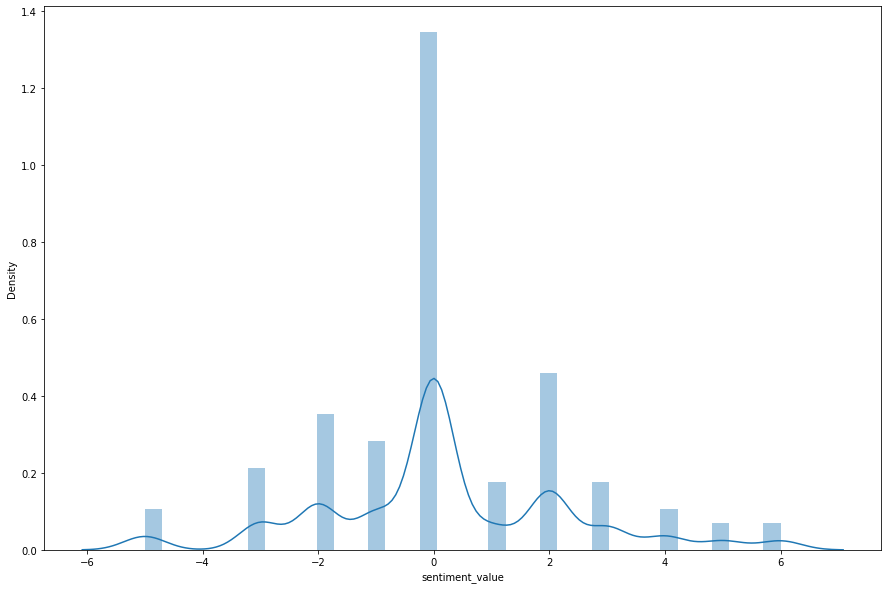

In [ ]:
# Plotting the sentiment value for whole review
import seaborn as sns
plt.figure(figsize=(15,10))
sns.distplot(sent_df['sentiment_value'])


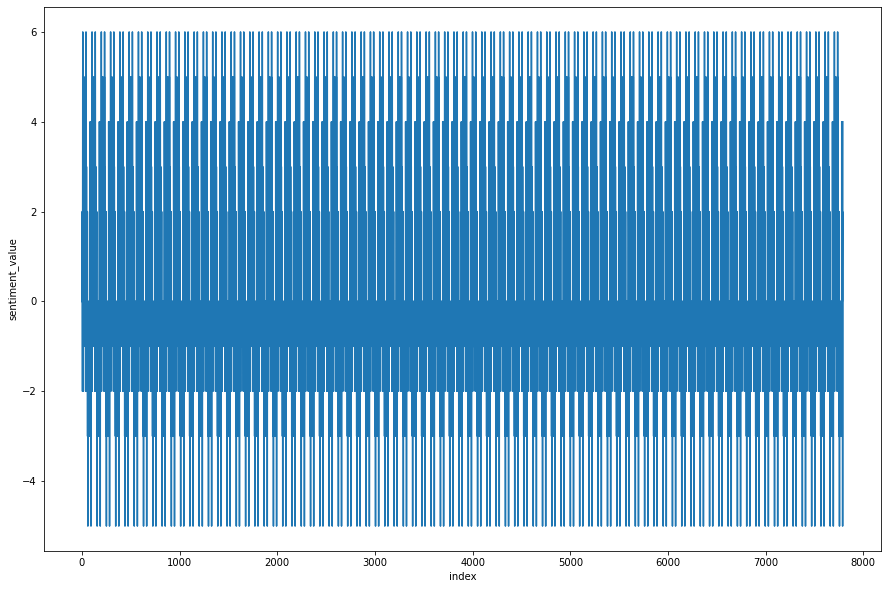

In [ ]:
# Plotting the line plot for sentiment value of whole review
plt.figure(figsize=(15,10))
sns.lineplot(y='sentiment_value',x='index',data=sent_df)